Taken the notebook from https://github.com/nageshsinghc4/Exoplanet-exploration and then made some modifications.

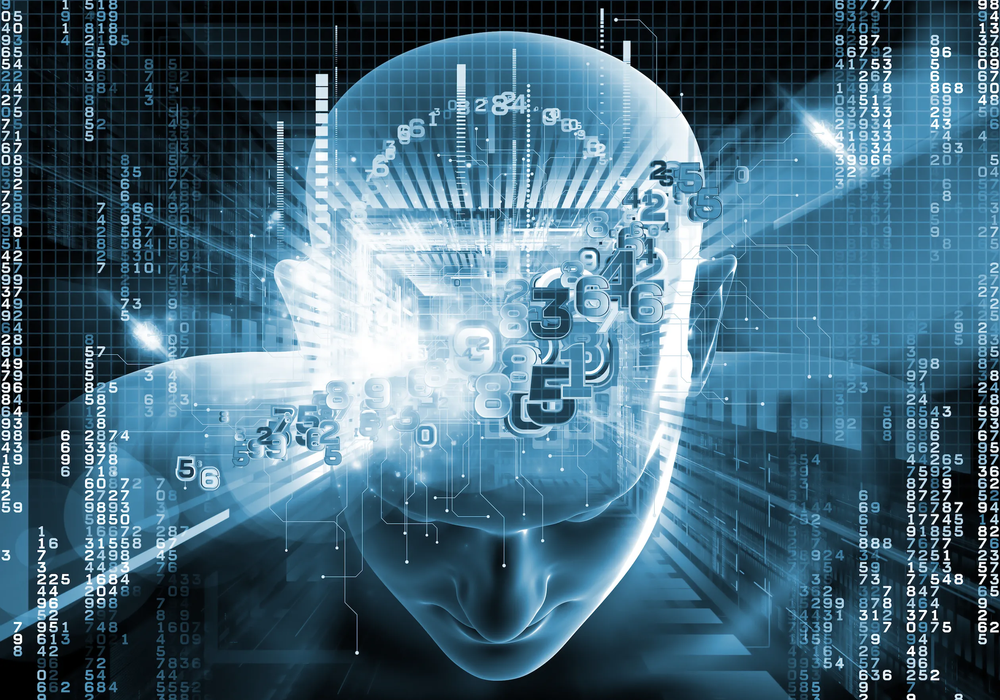
credits: https://www.google.com/url?sa=i&url=https%3A%2F%2Fbdtechtalks.com%2F2019%2F06%2F05%2Fmit-ibm-hybrid-ai%2F&psig=AOvVaw2L2daOL_ZhfFDgYPpxJzCb&ust=1684138735321000&source=images&cd=vfe&ved=0CBEQjRxqFwoTCOCb0uqv9P4CFQAAAAAdAAAAABBX

# Artificial Neural Network

ANN stands for Artificial Neural Networks, which are computational models inspired by the structure and function of the human brain. These networks are composed of interconnected processing elements, called neurons, which are organized into layers.

The input layer receives the data, and the output layer produces the network's final output. Between the input and output layers, there can be one or more hidden layers, which process the input data through a series of transformations to produce the final output.

Each neuron in the network receives input from the previous layer and produces an output that is passed on to the next layer. The output of a neuron is determined by its activation function, which can be linear or nonlinear.

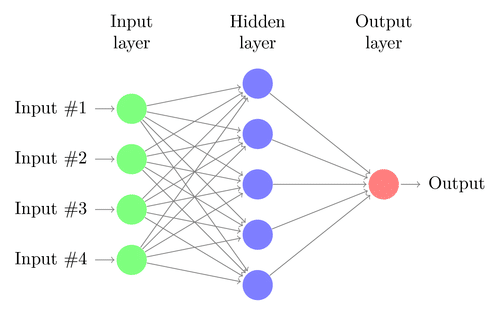

credits: https://www.google.com/url?sa=i&url=https%3A%2F%2Fresearch.aimultiple.com%2Fhow-neural-networks-work%2F&psig=AOvVaw2L2daOL_ZhfFDgYPpxJzCb&ust=1684138735321000&source=images&cd=vfe&ved=0CBEQjRxqFwoTCOCb0uqv9P4CFQAAAAAdAAAAABAQ

In [1]:
#importing necessary libraries
import os
import warnings
import math
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
from pylab import rcParams
rcParams['figure.figsize'] = 10, 6
from sklearn.metrics import mean_squared_error, mean_absolute_error
from imblearn.over_sampling import SMOTE
#from imblearn.over_sampling import ADASYN
#from imblearn.over_sampling import BorderlineSMOTE
from sklearn.model_selection import train_test_split 
from sklearn import linear_model
from sklearn.metrics import recall_score, classification_report, precision_score, confusion_matrix, accuracy_score,  roc_curve, auc
from sklearn.preprocessing import StandardScaler, normalize
from scipy import ndimage
import seaborn as sns


# Load train and test data

In [2]:
#the data sets have been downloaded from kaggle.
# https://www.kaggle.com/keplersmachines/kepler-labelled-time-series-data  
test_data = pd.read_csv('C:/Users/SREEPARNA/Downloads/exoTest.csv/exoTest.csv').fillna(0)
train_data = pd.read_csv('C:/Users/SREEPARNA/Downloads/exoTrain.csv/exoTrain.csv').fillna(0)
train_data.head()   #by default shows the first 5 rows

#.fillna(0) method is used to replace missing values with 0.

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,2,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,...,-78.07,-102.15,-102.15,25.13,48.57,92.54,39.32,61.42,5.08,-39.54
1,2,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,...,-3.28,-32.21,-32.21,-24.89,-4.86,0.76,-11.70,6.46,16.00,19.93
2,2,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,...,-71.69,13.31,13.31,-29.89,-20.88,5.06,-11.80,-28.91,-70.02,-96.67
3,2,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,...,5.71,-3.73,-3.73,30.05,20.03,-12.67,-8.77,-17.31,-17.35,13.98
4,2,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,...,-594.37,-401.66,-401.66,-357.24,-443.76,-438.54,-399.71,-384.65,-411.79,-510.54


FLUX1-FLUX3197 -> the light intensity recorded for each star, at a different point in time.

each row is for a particular star over different points of time.

### Changing the labels to 0 and 1

In [3]:
categ = {2: 1,1: 0}
train_data.LABEL = [categ[item] for item in train_data.LABEL]
test_data.LABEL = [categ[item] for item in test_data.LABEL]
#label column contains value either 1 or 2 in both the data sets. 
#here we are changing 1 to 0 and 2 to 1 for easier understanding.
# 1-presence of exoplanet; 0-no exoplanet

### Memory reduction of datasets

In [4]:
#Reduce memory
def reduce_memory(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    # .memory_usage() method calculates memory usage in bytes, returns a Series containing the memory usage of each column in the DataFrame. 
    #The ".sum()" method adds up the memory usage of all columns
    #this result is divided by 1024**2 to convert it from bytes to megabytes.
    # printed result is formatted to two decimal places with the ":{.2f}" placeholder.
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:                # != means not equal to
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64) 
                    
#If column is integer data type, the loop is checking if the minimum and maximum values 
#fall within the range of a specific integer data type (i.e., int8, int16, int32, or int64)
#if so, it casts the column to that data type using the ".astype()" method.      
#same for if it's a float data type
#if it's an object then it's casted into type category

            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    return df

test_data = reduce_memory(test_data)
train_data = reduce_memory(train_data)


Memory usage of dataframe is 13.91 MB
Memory usage after optimization is: 6.25 MB
Decreased by 55.1%
Memory usage of dataframe is 124.12 MB
Memory usage after optimization is: 62.04 MB
Decreased by 50.0%


Text(0.5, 1.0, 'Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)')

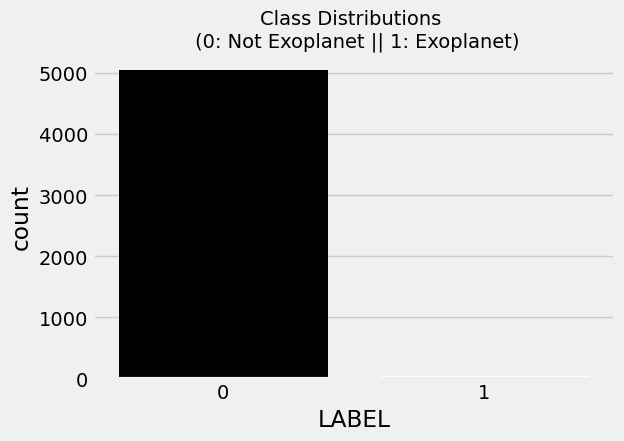

In [5]:
#Visualization to see the distribution between two labels:
plt.figure(figsize=(6,4))
colors = ["0", "1"]
sns.countplot('LABEL', data=train_data, palette=colors)
plt.title('Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)', fontsize=14)



### Let us plot the first 4 rows of the train data and observe the intensity of flux values.

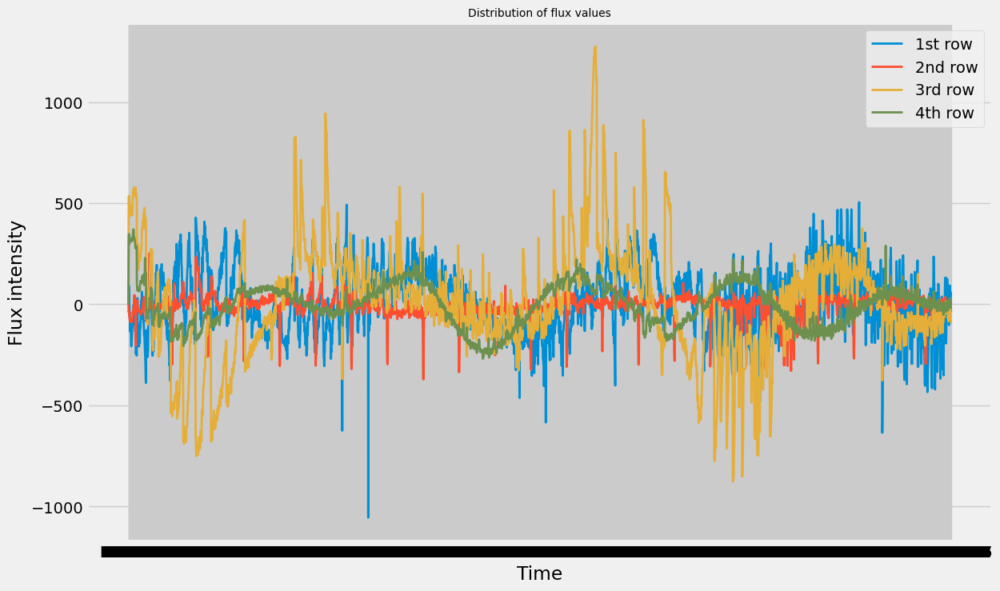

In [6]:
from pylab import rcParams
rcParams['figure.figsize'] = 13, 8
plt.title('Distribution of flux values', fontsize=10)
plt.xlabel('Time')
plt.ylabel('Flux intensity')
plt.plot(train_data.iloc[0,], linewidth=2, label = '1st row')    
plt.plot(train_data.iloc[1,], linewidth=2, label = '2nd row')   
plt.plot(train_data.iloc[2,], linewidth=2, label = '3rd row')
plt.plot(train_data.iloc[3,], linewidth=2, label = '4th row')
plt.legend()
plt.show()

# plot function is used here to create a line plot of the individual rows of the dataset
# The "iloc" function is used to extract a specific row from the dataset

From here we see that the data is clean, i.e., no missing values or discripencies are present; but not normalised (doesn't lie between 0 and 1 or -1 to 1).

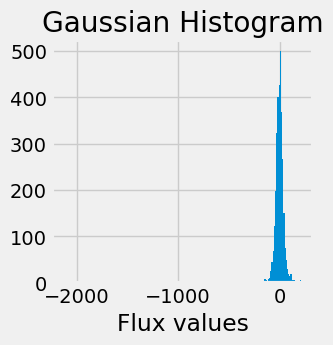

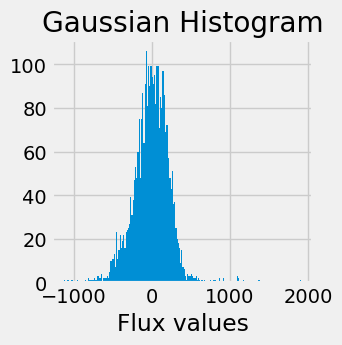

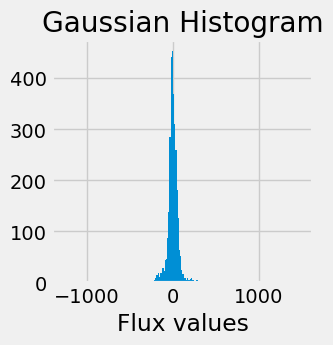

In [7]:
#Gaussian histogram of no exoplanets
labels_1=[100,200,300]    #these values here are values of row no. which has a non-exoplanet selected by looking at the data
for i in labels_1:
    plt.figure(figsize=(3,3))
    plt.hist(train_data.iloc[i,:], bins=200)
    plt.title("Gaussian Histogram")
    plt.xlabel("Flux values")
    plt.show()
# a series of histograms are created here depending on the no of rows (i)
# more rows can also be selected by adding the row no in the labels_1 list

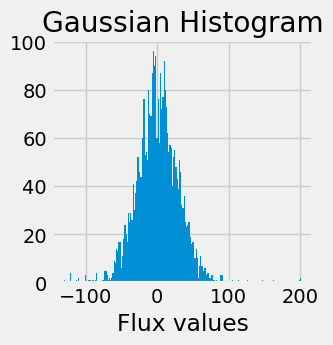

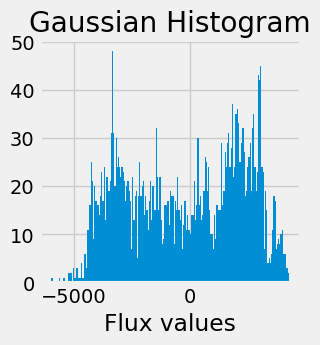

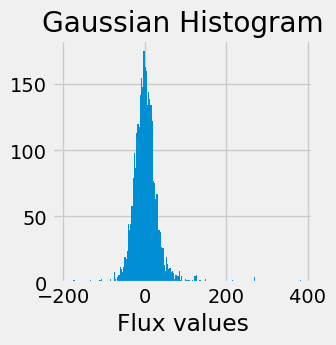

In [8]:
#Gaussian histogram of exoplanets
labels_1=[16,21,25]
for i in labels_1:
    plt.figure(figsize=(3,3))
    plt.hist(train_data.iloc[i,:], bins=200)
    plt.title("Gaussian Histogram")
    plt.xlabel("Flux values")
    plt.show()
    

### Splitting the datasets

In [9]:
#splitting the data based on labels 
x_train = train_data.drop(["LABEL"],axis=1)
y_train = train_data["LABEL"]   
x_test = test_data.drop(["LABEL"],axis=1)
y_test = test_data["LABEL"]

#droping a column from the dataframes and storing then in another variable

### Normalizing the datasets
The goal of normalization is to change the values of numeric columns in the dataset to a common scale, without distorting differences in the ranges of values.  This method scales the values of the features to be within a specified range, typically between 0 and 1 or -1 and 1. Here the data is normalized to ensure that each sample has the same scale and to potentially improve the performance of machine learning models. 

Normalization normally would be x_train/||x_train||
where ||x_train|| is the L2 norm of x_train, given by: ||x_train|| = sqrt(x_train_1^2 + ... + x_train_n^2)

The default normalization is L2. The other is L1 normalization.

Text(0.5, 1.0, 'variation of flux over time for a single star')

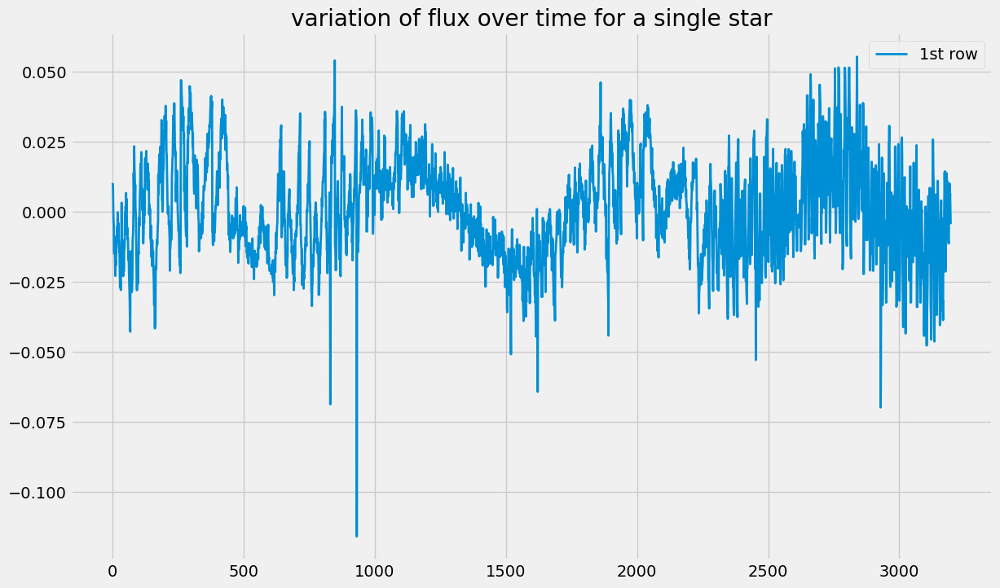

In [10]:
#Normalizing the data
x_train = normalized = normalize(x_train)
x_test = normalize(x_test)
#x_train[1]

plt.plot(x_train[0,], linewidth=2, label = '1st row') 
plt.legend()
plt.title('variation of flux over time for a single star')

### Applying gaussian filters

Text(0.5, 1.0, 'variation of flux over time for a single star')

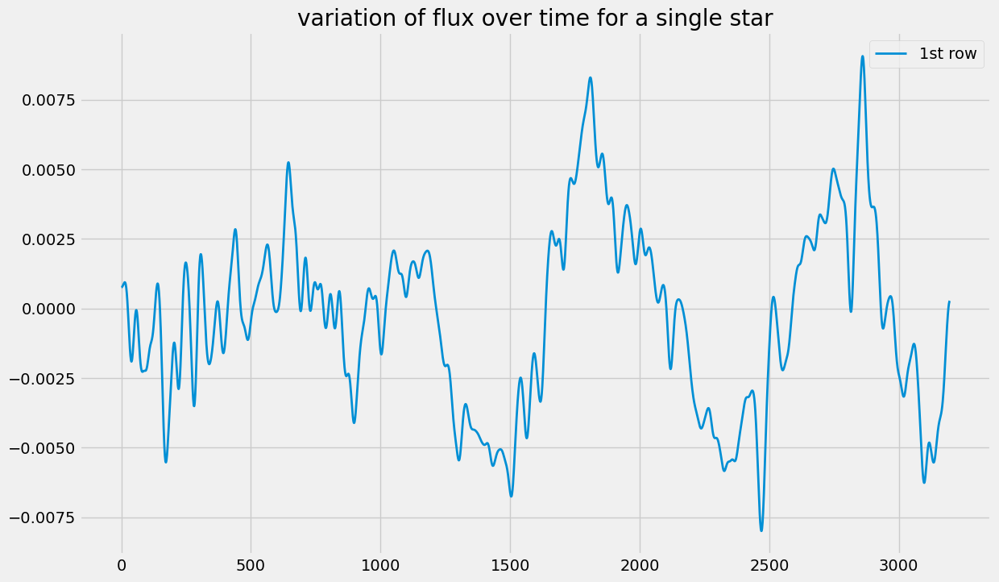

In [11]:
#Applying of gaussian filter
x_train = filtered = ndimage.filters.gaussian_filter(x_train, sigma=10)
#The filtered array is assigned to a new variable called "filtered" and also assigned to "x_train".

x_test = ndimage.filters.gaussian_filter(x_test, sigma=10)


# plotting for one star to see the changes after data processing
plt.plot(x_train[0,], linewidth=2, label = '1st row') 
plt.legend()
plt.title('variation of flux over time for a single star')

### Feature scaling
This method scales the values of the features to have zero mean and unit variance. This is done by subtracting the mean of each feature from the values and dividing by the standard deviation.

Text(0.5, 1.0, 'variation of flux over time for a single star')

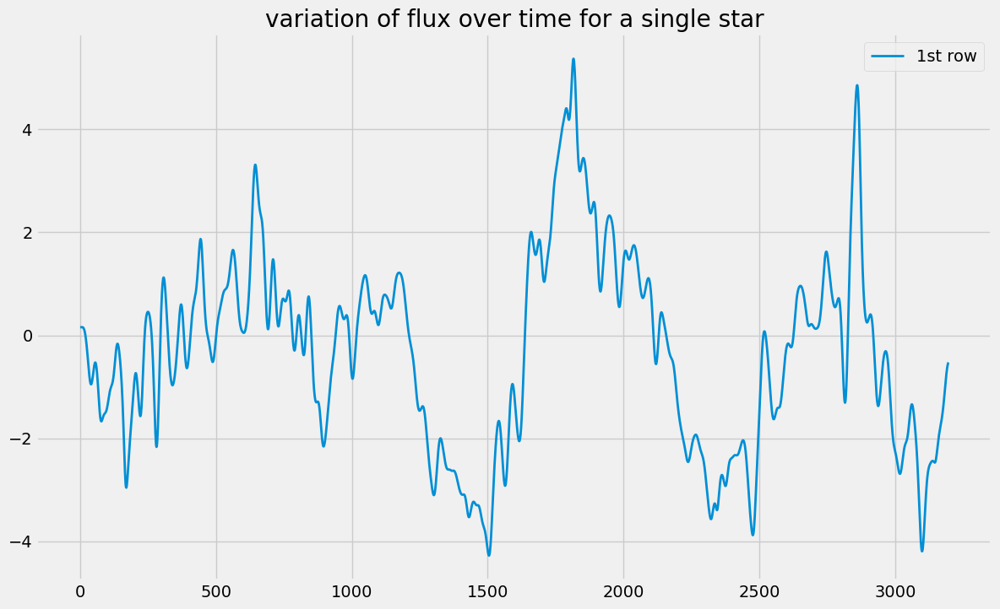

In [12]:
#Feature scaling
std_scaler = StandardScaler()
x_train = scaled = std_scaler.fit_transform(x_train)
x_test = std_scaler.fit_transform(x_test)

plt.plot(x_train[0,], linewidth=2, label = '1st row') 
plt.legend()
plt.title('variation of flux over time for a single star')

### Applying PCA
***PCA-principal component analysis***
PCA is a technique for reducing the dimensionality of high-dimensional data by projecting it onto a lower-dimensional space while retaining most of the information. It achieves this by identifying a set of orthogonal directions in the high-dimensional space (called principal components) that capture the most variation in the data.

In [13]:
#Dimentioanlity reduction

from sklearn.decomposition import PCA
pca = PCA() 
x_train = pca.fit_transform(x_train)  # transforms the data into the lower-dimensional space.
x_test = pca.transform(x_test)
total=sum(pca.explained_variance_)
k=0
current_variance=0
while current_variance/total < 0.90:
    current_variance += pca.explained_variance_[k]
    k=k+1
print(k)    
#calculates number of principal components to retain with the condition on the total variance in the data. 
# in k is stored the principal component values after each iteration.
#the dimensionality of the data reduced to k dimensions.    
# here the no of columns i.e. no of fluxes at different times is reduces from 3197 to k(37)    


37


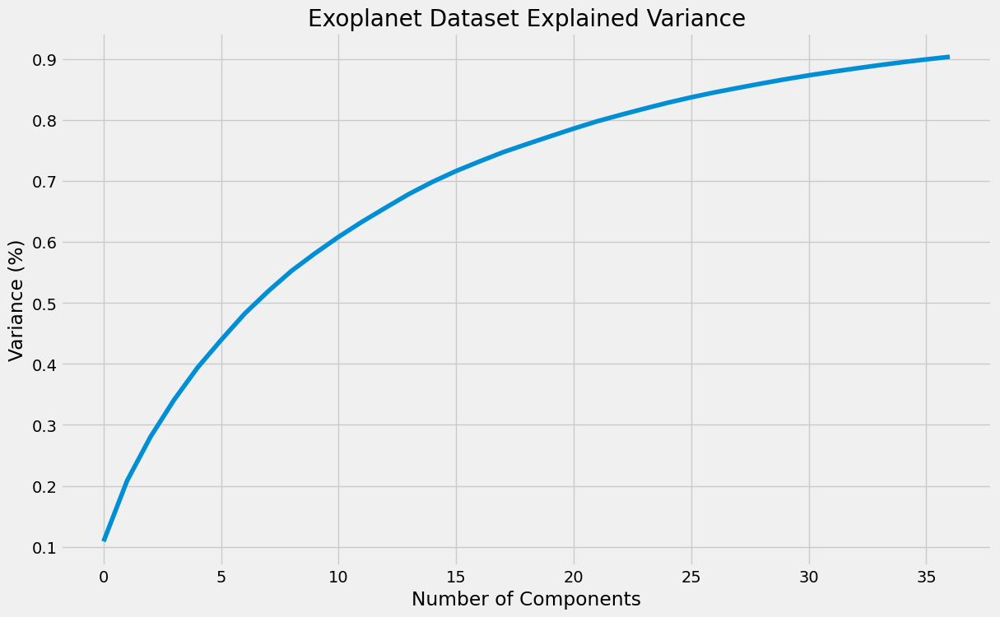

In [14]:
"""
This plot tells us that selecting 37 components we can preserve something around 98.8% or 99% 
of the total variance of the data. It makes sense, we’ll not use 100% of our variance,
because it denotes all components, and we want only the principal ones.
"""
#Apply PCA with n_componenets
pca = PCA(n_components=37)
x_train = pca.fit_transform(x_train)
x_test = pca.transform(x_test)
#plots the cumulative explained variance ratio as a function of the number of principal components retained after applying PCA.
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Exoplanet Dataset Explained Variance')
plt.show()
        


In [15]:
len(x_train[0])

37

RangeIndex(start=0, stop=37, step=1)

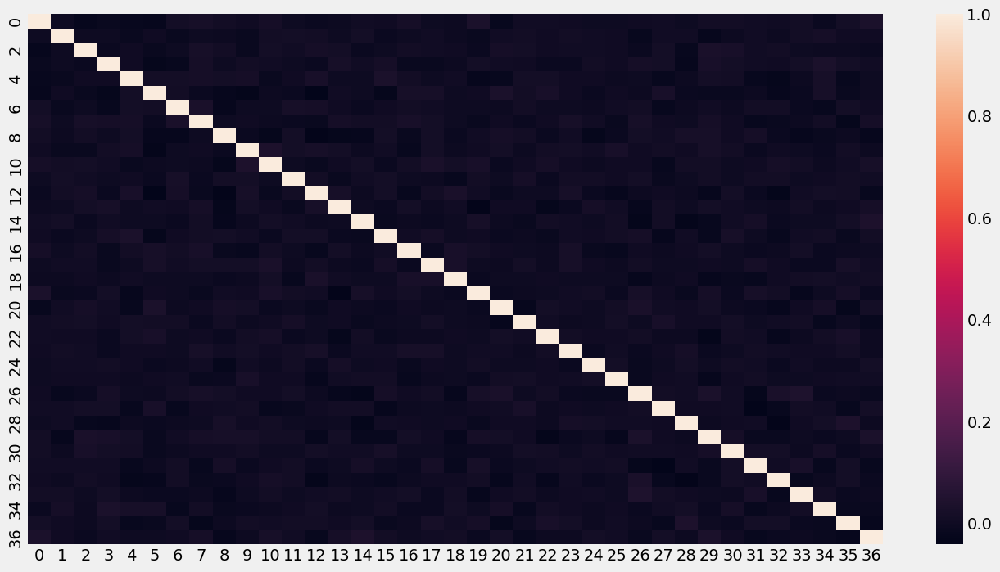

In [16]:
df = pd.DataFrame.from_records(x_train)  # x_train is converted to a pandas DataFrame    
corr = df.corr(method='kendall')   #computing Kendall rank correlation coefficients between all pairs of features
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=False)  #annot=True adds numerical values of the correlation coefficients to each cell of the heatmap.
df.columns

In [17]:
y_train.ravel()

array([1, 1, 1, ..., 0, 0, 0], dtype=int8)

In [18]:
x_train

array([[ 46.931236 ,  18.13758  ,  58.753353 , ..., -12.4796295,
         -3.2431283,  -3.7498312],
       [ 46.96289  ,  18.151249 ,  58.490364 , ..., -12.423285 ,
         -3.24075  ,  -3.7528718],
       [ 47.027916 ,  18.18191  ,  57.968086 , ..., -12.308719 ,
         -3.2355611,  -3.7592254],
       ...,
       [-18.983006 , -33.63281  ,   5.70013  , ...,   5.8819437,
         -6.002911 ,  -4.3054957],
       [-19.099457 , -33.931805 ,   5.759208 , ...,   5.964103 ,
         -5.974138 ,  -4.251886 ],
       [-19.15557  , -34.082485 ,   5.7895927, ...,   6.005624 ,
         -5.9590487,  -4.2251897]], dtype=float32)

### Over-sampling using SMOTE

In [19]:
#Resampling as the data is highly unbalanced.
print("Before OverSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train==0)))

sm = SMOTE(random_state=27, sampling_strategy = 1.0)
# SMOTE HAS NO keyword argument ratio, so instead using sampling_strategy

#below are few other different methods of resampling.
#ad = ADASYN(sampling_strategy=1.0, random_state=27)
#bd = BorderlineSMOTE(sampling_strategy=1.0, random_state=27)

#it might happen that oversampling using SMOTE or other methods might not work like it happened for me here
#in that case you either need to check the numpy version or install threadpoolctl

#SMOTE cannot handle more than 15 columns in data frame. 
#More columns cause issues in SMOTE and a "None Type" exception will raise. 
#You have to install threadpoolctl package to resolve the issue.
#pip install -U threadpoolctl



Before OverSampling, counts of label '1': 37
Before OverSampling, counts of label '0': 5050 



In [20]:
x_train_res, y_train_res = sm.fit_resample(x_train, y_train.ravel()) 
# .fit_sample() doesn't work if we import imblearn.over_sampling import SMOTE


print("After OverSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res==0)))


After OverSampling, counts of label '1': 5050
After OverSampling, counts of label '0': 5050


#x_test

In [21]:

#pip install --upgrade numpy

In [22]:
#Artificial Neural Network
#machine learning model inspired by the structure and function of the human brain

#needed to install tensorflow
#from tensorflow import set_random_seed
#set_random_seed(101)

import tensorflow as tf
tf.random.set_seed(101)
#print(tf.__version__)

from sklearn.model_selection import cross_val_score
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential # initialize neural network library
from keras.layers import Dense # build our layers library

#creating a neural network classifier using the Keras library and cross-validating it with 5 folds

def build_classifier():
    classifier = Sequential() # initialize neural network
    classifier.add(Dense(units = 4, kernel_initializer = 'uniform', activation = 'relu', input_dim = x_train_res.shape[1]))
    classifier.add(Dense(units = 4, kernel_initializer = 'uniform', activation = 'relu'))
    classifier.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))
    classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
    return classifier

# the function has 3 layers: 2 hidden layers with 4 nodes each, and an output layer with 1 node 
#hidden layers-'relu' and output layer-sigmoid'
# 'relu' stands for Rectified Linear Unit, which is a popular activation function for introducing non-linearity.
#cross_val_score function is used to evaluate the performance of the model using 5-fold cross-validation
# the "units" parameter determines the number of neurons in each layer of the neural network. 
#The choice of the number of units can affect the capacity and complexity of the model, which can impact its ability to learn and generalize from the data.
# units here is the hyperparameter which is user input

classifier = KerasClassifier(build_fn = build_classifier, epochs = 40)
accuracies = cross_val_score(estimator = classifier, X = x_train_res, y = y_train_res, cv = 5, n_jobs = -1)
mean = accuracies.mean()
variance = accuracies.std()
print("Accuracy mean: "+ str(mean))
print("Accuracy variance: "+ str(variance))




Accuracy mean: 0.8462376117706298
Accuracy variance: 0.17082798663242435


In [23]:
#splitting the dataset
train_X, test_X, train_y, test_y = train_test_split(x_train_res, y_train_res, test_size=0.33, random_state=42)

In [24]:

classifier.fit(train_X,train_y)

prediction=classifier.predict(test_X)

print('Validation accuracy of ANN classifier is', accuracy_score(prediction,test_y))
print ("\nClassification report :\n",(classification_report(test_y,prediction)))


Epoch 1/40
212/212 [==============================] - 1s 3ms/step - loss: 0.4352 - accuracy: 0.8471
Epoch 2/40
212/212 [==============================] - 0s 2ms/step - loss: 0.0711 - accuracy: 0.9953
Epoch 3/40
212/212 [==============================] - 1s 3ms/step - loss: 0.0186 - accuracy: 0.9990
Epoch 4/40
212/212 [==============================] - 1s 3ms/step - loss: 0.0084 - accuracy: 0.9996
Epoch 5/40
212/212 [==============================] - 1s 2ms/step - loss: 0.0048 - accuracy: 0.9997
Epoch 6/40
212/212 [==============================] - 1s 2ms/step - loss: 0.0031 - accuracy: 0.9999
Epoch 7/40
212/212 [==============================] - 1s 2ms/step - loss: 0.0023 - accuracy: 0.9999
Epoch 8/40
212/212 [==============================] - 1s 3ms/step - loss: 0.0016 - accuracy: 0.9999
Epoch 9/40
212/212 [==============================] - 1s 3ms/step - loss: 0.0014 - accuracy: 0.9999
Epoch 10/40
212/212 [==============================] - 1s 3ms/step - loss: 0.0011 - accuracy: 0.9999

The classification report provides a summary of the performance of a classification model. In this case, the report shows the results of a classification task with two classes: 0 and 1.

The precision, recall, and F1-score are common evaluation metrics used in classification tasks:

    Precision: Precision is a measure of how many selected instances are relevant. It is calculated as the number of true positives divided by the sum of true positives and false positives. In this report, both classes (0 and 1) have a precision of 1.00, indicating that all the instances predicted as belonging to each class are correct.

    Recall: Recall, also known as sensitivity or true positive rate, is a measure of how many relevant instances are selected. It is calculated as the number of true positives divided by the sum of true positives and false negatives. Both classes have a recall of 1.00, indicating that all the instances of each class are correctly identified.

    F1-score: The F1-score is the harmonic mean of precision and recall, providing a single metric that combines both measures. It is useful when you want to balance precision and recall. The F1-score ranges from 0 to 1, with 1 being the best value. In this report, both classes have an F1-score of 1.00, indicating excellent performance.

The support column represents the number of instances in each class in the dataset. For class 0, there are 1,700 instances, while for class 1, there are 1,633 instances.

The accuracy of the model is also provided, which is the proportion of correctly classified instances out of the total number of instances. In this case, the accuracy is 1.00, meaning that the model classified all 3,333 instances correctly.

The macro avg and weighted avg values provide the average scores across all classes, giving equal weight (macro avg) or weighting by the number of instances (weighted avg).

Overall, this classification report suggests that the model has achieved perfect performance with high precision, recall, F1-score, and accuracy for both classes.

105/105 [==============================] - 0s 2ms/step


Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

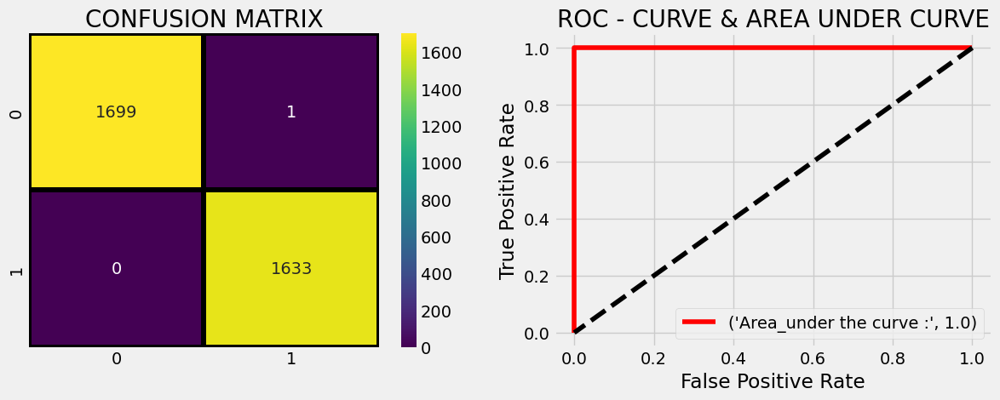

In [25]:
#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)
# (y_test) are the true labels and (prediction) are the predicted labels
#fmt = "d" formats the values as integers
#annot=True parameter adds the numerical values to each cell

#ROC curve and Area under the curve plotting
predicting_probabilites = classifier.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
#plots the ROC curve by connecting the FPR and TPR values at different threshold values
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
#plots the diagonal line from the bottom left to the top right representing ROC curve of a random classifier.
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)
#ROC curve and Area under the curve plotting
#ROC - Receiver Operating Characteristic
#graphical representation of performance of a binary classification model.
#True Positive Rate (TPR)-ratio of true positives to total number of actual positives 
#False Positive Rate (FPR)-ratio of false positives to the total number of actual negatives.
#auc-area under curve

As we can observe on applying SMOTE to balance the classes, the model gives better results.
Also with area under the curve equal to 1.0, we can sau classifying using ANN is one of the best methods of classification.

### SVM classifier

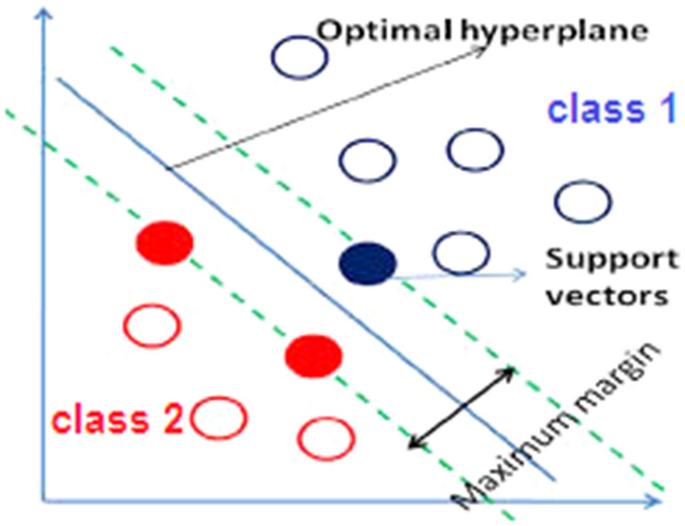
credits: https://www.google.com/url?sa=i&url=https%3A%2F%2Fbmcresnotes.biomedcentral.com%2Farticles%2F10.1186%2Fs13104-020-05180-5&psig=AOvVaw1aUZGPlmv1DDxXf0Orrk23&ust=1684353965264000&source=images&cd=vfe&ved=0CBEQjRxqFwoTCNi8q9DR-v4CFQAAAAAdAAAAABAi

In [26]:

def model(classifier,dtrain_x,dtrain_y,dtest_x,dtest_y):
    #fit the model
    classifier.fit(dtrain_x,dtrain_y)
    predictions = classifier.predict(dtest_x)

    #Cross validation
    accuracies = cross_val_score(estimator = classifier, X = x_train_res, y = y_train_res, cv = 5, n_jobs = -1)
    mean = accuracies.mean()
    variance = accuracies.std()
    print("Accuracy mean: "+ str(mean))
    print("Accuracy variance: "+ str(variance))

    #Accuracy
    print ("\naccuracy_score :",accuracy_score(dtest_y,predictions))

    #Classification report
    print ("\nclassification report :\n",(classification_report(dtest_y,predictions)))

    #Confusion matrix
    plt.figure(figsize=(13,10))
    plt.subplot(221)
    sns.heatmap(confusion_matrix(dtest_y,predictions),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
    plt.title("CONFUSION MATRIX",fontsize=20)



Accuracy mean: 0.9991089108910891
Accuracy variance: 0.0017821782178217838

accuracy_score : 0.9912280701754386

classification report :
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       565
           1       0.00      0.00      0.00         5

    accuracy                           0.99       570
   macro avg       0.50      0.50      0.50       570
weighted avg       0.98      0.99      0.99       570



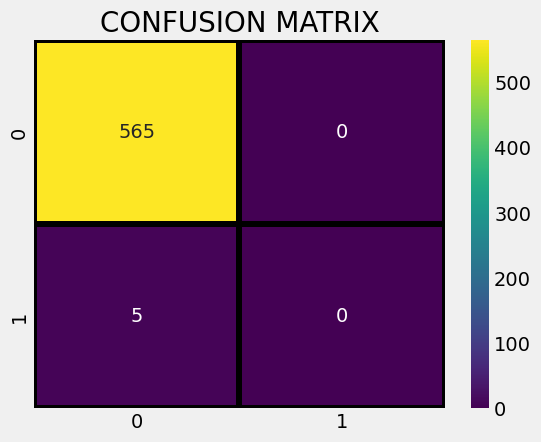

In [27]:
from sklearn.svm import SVC
SVM_model=SVC()
model(SVM_model,x_train_res,y_train_res,x_test,y_test)

### Random Forest classifier

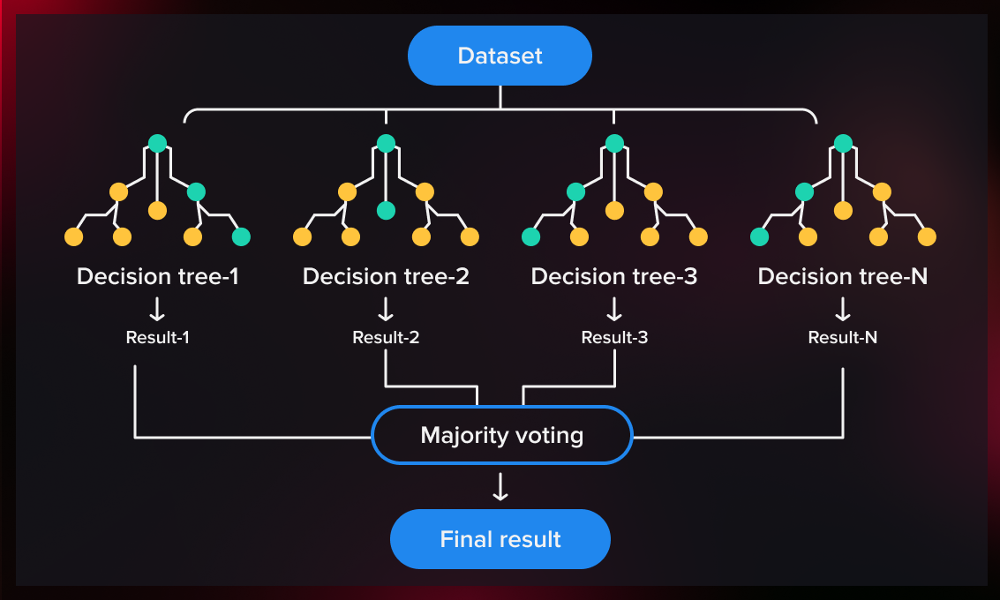
credits: https://www.google.com/url?sa=i&url=https%3A%2F%2Fserokell.io%2Fblog%2Frandom-forest-classification&psig=AOvVaw1bA1RT71otYnHvHxU9YoxV&ust=1684354258487000&source=images&cd=vfe&ved=0CBEQjRxqFwoTCNjxltzS-v4CFQAAAAAdAAAAABAE

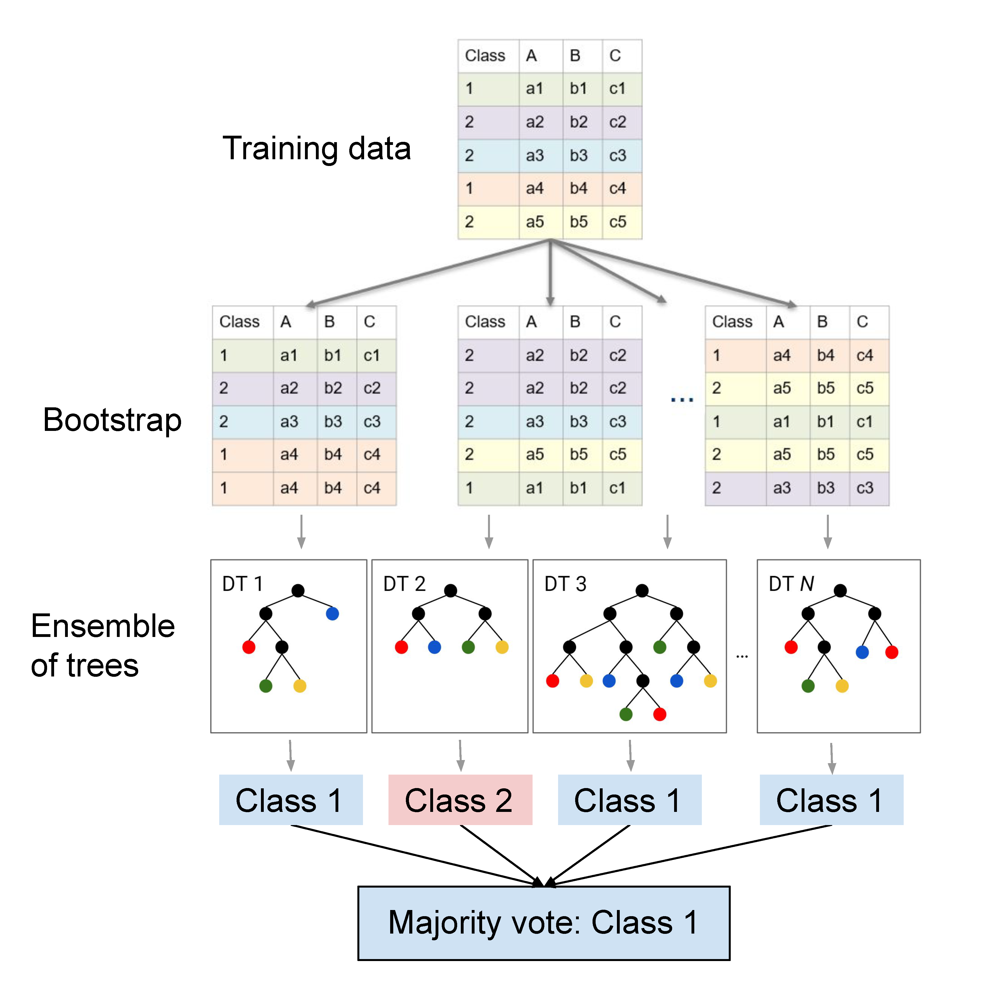
credits: https://www.google.com/url?sa=i&url=https%3A%2F%2Fpages.cms.hu-berlin.de%2FEOL%2Fgeo_rs%2FS09_Image_classification2.html&psig=AOvVaw1bA1RT71otYnHvHxU9YoxV&ust=1684354258487000&source=images&cd=vfe&ved=0CBEQjRxqFwoTCNjxltzS-v4CFQAAAAAdAAAAABAJ

Accuracy mean: 0.9999009900990099
Accuracy variance: 0.0001980198019801982

accuracy_score : 0.9912280701754386

classification report :
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       565
           1       0.00      0.00      0.00         5

    accuracy                           0.99       570
   macro avg       0.50      0.50      0.50       570
weighted avg       0.98      0.99      0.99       570



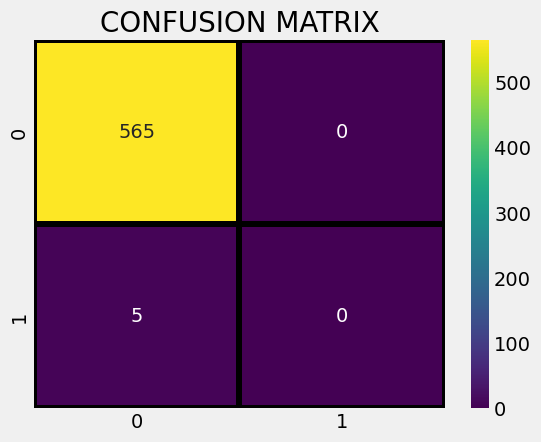

In [31]:

from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier()
model(rf_classifier,x_train_res,y_train_res,x_test,y_test)


### Display feature importance  

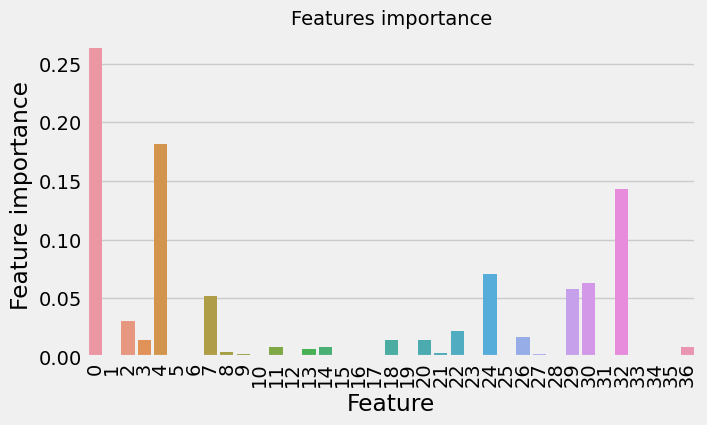

In [30]:
 
df1 = pd.DataFrame.from_records(x_train)     
tmp = pd.DataFrame({'Feature': df1.columns, 'Feature importance': rf_classifier.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()
